In [ ]:
import os
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as transforms
from torchvision.utils import make_grid
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score
import time


In [ ]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed()

In [ ]:
# Constants
BATCH_SIZE = 64
EPOCHS = 50
LEARNING_RATE = 1e-4
IMG_SIZE = 256
NUM_CLASSES = 6 
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
class ColorectalCancerDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.class_names = ['Adenocarcinoma', 'High-grade IN', 'Low-grade IN', 
                           'Normal', 'Polyp', 'Serrated adenoma']
        self.samples = []
        
        for class_idx, class_name in enumerate(self.class_names):
            class_dir = os.path.join(root_dir, class_name)
            image_dir = os.path.join(class_dir, 'image')
            mask_dir = os.path.join(class_dir, 'label')
            
            image_files = os.listdir(image_dir)
            for img_file in image_files:
                img_path = os.path.join(image_dir, img_file)
                mask_path = os.path.join(mask_dir, img_file)
                
                if os.path.exists(mask_path):
                    self.samples.append({
                        'image_path': img_path,
                        'mask_path': mask_path,
                        'class_idx': class_idx,
                        'class_name': class_name
                    })
        
        print(f"Total samples loaded: {len(self.samples)}")
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        sample = self.samples[idx]
        
        image = Image.open(sample['image_path']).convert('RGB')
        mask = Image.open(sample['mask_path']).convert('L')  
        
        if self.transform:
            seed = np.random.randint(2147483647)
            
            random.seed(seed)
            torch.manual_seed(seed)
            image = self.transform(image)
            
            random.seed(seed)
            torch.manual_seed(seed)
            mask = self.transform(mask)
        
        mask = (mask > 0.5).float()
        
        return {
            'image': image,
            'mask': mask,
            'class_idx': torch.tensor(sample['class_idx'], dtype=torch.long),
            'class_name': sample['class_name'],
            'image_path': sample['image_path']
        }


In [ ]:
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])

img_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
    transforms.ToTensor(),
])


In [ ]:
def load_dataset(data_dir):
    full_dataset = ColorectalCancerDataset(root_dir=data_dir, transform=transform)
    
    total_size = len(full_dataset)
    train_size = int(0.8 * total_size)
    test_size = total_size - train_size
    
    train_dataset, test_dataset = random_split(
        full_dataset, [train_size, test_size],
        generator=torch.Generator().manual_seed(42)
    )
    
    print(f"Train dataset: {len(train_dataset)} samples")
    print(f"Test dataset: {len(test_dataset)} samples")
    
    # Create data loaders
    train_loader = DataLoader(
        train_dataset, 
        batch_size=BATCH_SIZE, 
        shuffle=True, 
        drop_last=True
    )
    
    test_loader = DataLoader(
        test_dataset, 
        batch_size=BATCH_SIZE, 
        shuffle=False, 
    )
    
    return train_loader, test_loader, train_dataset, test_dataset


In [ ]:

class PatchEmbedding(nn.Module):
    def __init__(self, img_size=256, patch_size=16, in_channels=3, embed_dim=768):
        super().__init__()
        self.img_size = img_size
        self.patch_size = patch_size
        self.n_patches = (img_size // patch_size) ** 2
        
        self.proj = nn.Conv2d(
            in_channels, embed_dim, 
            kernel_size=patch_size, stride=patch_size
        )
    
    def forward(self, x):
        x = self.proj(x)  
        x = x.flatten(2) 
        x = x.transpose(1, 2)  
        return x

class MultiHeadSelfAttention(nn.Module):
    def __init__(self, embed_dim, num_heads):
        super().__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.head_dim = embed_dim // num_heads
        assert self.head_dim * num_heads == embed_dim, "embed_dim must be divisible by num_heads"
        
        self.qkv = nn.Linear(embed_dim, embed_dim * 3)
        self.proj = nn.Linear(embed_dim, embed_dim)
        self.scale = self.head_dim ** -0.5
    
    def forward(self, x):
        B, N, C = x.shape
        qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, self.head_dim).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2] 
        
        attn = (q @ k.transpose(-2, -1)) * self.scale  
        attn = attn.softmax(dim=-1)
        
        x = (attn @ v).transpose(1, 2).reshape(B, N, C)
        x = self.proj(x)
        return x, attn

class TransformerEncoder(nn.Module):
    def __init__(self, embed_dim, num_heads, mlp_ratio=4.0, dropout=0.1):
        super().__init__()
        self.norm1 = nn.LayerNorm(embed_dim)
        self.attn = MultiHeadSelfAttention(embed_dim, num_heads)
        self.norm2 = nn.LayerNorm(embed_dim)
        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, int(embed_dim * mlp_ratio)),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(int(embed_dim * mlp_ratio), embed_dim),
            nn.Dropout(dropout)
        )
        self.dropout = nn.Dropout(dropout)
    
    def forward(self, x):
        shortcut = x
        x = self.norm1(x)
        x_attn, attention = self.attn(x)
        x = shortcut + self.dropout(x_attn)
        
        shortcut = x
        x = self.norm2(x)
        x = shortcut + self.dropout(self.mlp(x))
        
        return x, attention

class VisionTransformer(nn.Module):
    def __init__(self, img_size=256, patch_size=16, in_channels=3, 
                 embed_dim=768, depth=12, num_heads=12, mlp_ratio=4.0, 
                 dropout=0.1):
        super().__init__()
        self.patch_embed = PatchEmbedding(
            img_size=img_size, patch_size=patch_size, 
            in_channels=in_channels, embed_dim=embed_dim
        )
        
        self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))
        self.pos_embed = nn.Parameter(torch.zeros(1, 1 + self.patch_embed.n_patches, embed_dim))
        
        self.blocks = nn.ModuleList([
            TransformerEncoder(embed_dim, num_heads, mlp_ratio, dropout)
            for _ in range(depth)
        ])
        
        self.norm = nn.LayerNorm(embed_dim)
        
        self.initialize_weights()
    
    def initialize_weights(self):
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        nn.init.trunc_normal_(self.cls_token, std=0.02)
    
    def forward(self, x):
        B = x.shape[0]
        x = self.patch_embed(x)  
        
        cls_tokens = self.cls_token.expand(B, -1, -1)  
        x = torch.cat((cls_tokens, x), dim=1) 
        x = x + self.pos_embed  
        
        attentions = []
        for block in self.blocks:
            x, attention = block(x)
            attentions.append(attention)
        
        x = self.norm(x)
        
        return x, attentions

class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x, skip=None):
        x = self.up(x)
        if skip is not None:
            x = torch.cat([x, skip], dim=1)
        x = self.conv(x)
        return x

class ExpertModule(nn.Module):
    def __init__(self, in_channels, mid_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(mid_channels)
        self.conv2 = nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
    
    def forward(self, x):
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.relu(self.bn2(self.conv2(x)))
        return x

class DynamicRouter(nn.Module):
    def __init__(self, channels, num_experts):
        super().__init__()
        self.num_experts = num_experts
        
        self.spatial_attn = nn.Sequential(
            nn.Conv2d(channels, channels // 4, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels // 4),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels // 4, 1, kernel_size=1),
            nn.Sigmoid()
        )
        
        self.channel_avg_pool = nn.AdaptiveAvgPool2d(1)
        self.channel_max_pool = nn.AdaptiveMaxPool2d(1)
        self.channel_fc = nn.Sequential(
            nn.Conv2d(channels, channels // 4, kernel_size=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels // 4, channels, kernel_size=1),
            nn.Sigmoid()
        )
        
        self.router = nn.Sequential(
            nn.Conv2d(channels, channels // 2, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels // 2),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(channels // 2, num_experts),
            nn.Softmax(dim=1)
        )
    
    def forward(self, x):
        spatial_attn = self.spatial_attn(x)
        x_spatial = x * spatial_attn
        
        avg_pool = self.channel_avg_pool(x)
        max_pool = self.channel_max_pool(x)
        channel_attn = self.channel_fc(avg_pool) + self.channel_fc(max_pool)
        x_channel = x * channel_attn
        
        x_attn = x_spatial + x_channel
        
        routing_weights = self.router(x_attn)
        
        return routing_weights

class MixtureOfExperts(nn.Module):
    def __init__(self, in_channels, mid_channels, out_channels, num_experts=4):
        super().__init__()
        self.num_experts = num_experts
        self.experts = nn.ModuleList([
            ExpertModule(in_channels, mid_channels, out_channels) 
            for _ in range(num_experts)
        ])
        self.router = DynamicRouter(in_channels, num_experts)
    
    def forward(self, x):
        routing_weights = self.router(x)  
        
        expert_outputs = []
        for i, expert in enumerate(self.experts):
            expert_output = expert(x)
            expert_outputs.append(expert_output)
        
        stacked_experts = torch.stack(expert_outputs, dim=1) 
        B, E, C, H, W = stacked_experts.shape
        
        routing_weights = routing_weights.view(B, E, 1, 1, 1)
        output = (stacked_experts * routing_weights).sum(dim=1) 
        
        return output, routing_weights.squeeze(-1).squeeze(-1).squeeze(-1)

class AuxiliaryClassifier(nn.Module):
    def __init__(self, in_channels, num_classes):
        super().__init__()
        self.pooling = nn.AdaptiveAvgPool2d(1)
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_channels, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )
    
    def forward(self, x):
        x = self.pooling(x)
        x = self.classifier(x)
        return x

class MoEViTUNet(nn.Module):
    def __init__(self, img_size=256, patch_size=16, in_channels=3, 
                 embed_dim=768, depth=12, num_heads=12, num_classes=6, 
                 num_experts=4, dropout=0.1):
        super().__init__()
        
        self.vit = VisionTransformer(
            img_size=img_size, patch_size=patch_size, 
            in_channels=in_channels, embed_dim=embed_dim,
            depth=depth, num_heads=num_heads, dropout=dropout
        )
        
        self.patch_size = patch_size
        self.embed_dim = embed_dim
        
        self.feature_dims = [256, 128, 64, 32]
        h_dim = img_size // patch_size
        
        self.conv_transform = nn.Conv2d(embed_dim, self.feature_dims[0], kernel_size=1)
        
        self.moe1 = MixtureOfExperts(self.feature_dims[0], self.feature_dims[0], self.feature_dims[0], num_experts)
        self.moe2 = MixtureOfExperts(self.feature_dims[0], self.feature_dims[0], self.feature_dims[1], num_experts)
        self.moe3 = MixtureOfExperts(self.feature_dims[1], self.feature_dims[1], self.feature_dims[2], num_experts)
        self.moe4 = MixtureOfExperts(self.feature_dims[2], self.feature_dims[2], self.feature_dims[3], num_experts)
        
        self.decoder1 = DecoderBlock(self.feature_dims[0], self.feature_dims[1])
        self.decoder2 = DecoderBlock(self.feature_dims[1] * 2, self.feature_dims[2])
        self.decoder3 = DecoderBlock(self.feature_dims[2] * 2, self.feature_dims[3])
        self.decoder4 = DecoderBlock(self.feature_dims[3], self.feature_dims[3]) 
        
        self.aux_classifier1 = AuxiliaryClassifier(self.feature_dims[0], num_classes)
        self.aux_classifier2 = AuxiliaryClassifier(self.feature_dims[1], num_classes)
        self.aux_classifier3 = AuxiliaryClassifier(self.feature_dims[2], num_classes)
        self.aux_classifier4 = AuxiliaryClassifier(self.feature_dims[3], num_classes)
        
        self.final_conv = nn.Conv2d(self.feature_dims[3], 1, kernel_size=1)
        
        self.main_classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(self.feature_dims[3], 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )
    
    def reshape_transformer_output(self, x):
        x = x[:, 1:, :]
        
        h = w = int(np.sqrt(x.shape[1]))
        x = x.reshape(x.shape[0], h, w, self.embed_dim)
        x = x.permute(0, 3, 1, 2)  
        
        return x
    
    def forward(self, x):
        vit_features, attentions = self.vit(x) 
        
        feature_map = self.reshape_transformer_output(vit_features)  
        
        x0 = self.conv_transform(feature_map) 
        
        x1, moe_weights1 = self.moe1(x0) 
        aux1 = self.aux_classifier1(x1)
        
        x2, moe_weights2 = self.moe2(x1) 
        aux2 = self.aux_classifier2(x2)
        
        x3, moe_weights3 = self.moe3(x2) 
        aux3 = self.aux_classifier3(x3)
        
        x4, moe_weights4 = self.moe4(x3)
        aux4 = self.aux_classifier4(x4)
        
        d1 = self.decoder1(x1)  
        
        if d1.size(2) != x2.size(2) or d1.size(3) != x2.size(3):
            x2_resized = F.interpolate(x2, size=(d1.size(2), d1.size(3)), mode='bilinear', align_corners=True)
        else:
            x2_resized = x2
        d2 = self.decoder2(torch.cat([d1, x2_resized], dim=1))  
        
        if d2.size(2) != x3.size(2) or d2.size(3) != x3.size(3):
            x3_resized = F.interpolate(x3, size=(d2.size(2), d2.size(3)), mode='bilinear', align_corners=True)
        else:
            x3_resized = x3
        d3 = self.decoder3(torch.cat([d2, x3_resized], dim=1)) 
        
        d4 = self.decoder4(d3)  
        
        d4_upsampled = F.interpolate(d4, size=(x.size(2), x.size(3)), mode='bilinear', align_corners=True)
        
        main_class = self.main_classifier(d4)
        
        mask = self.final_conv(d4_upsampled)
        mask = torch.sigmoid(mask)
        
        return {
            'mask': mask,
            'main_class': main_class,
            'aux1': aux1,
            'aux2': aux2,
            'aux3': aux3,
            'aux4': aux4,
            'attentions': attentions,
            'moe_weights': [moe_weights1, moe_weights2, moe_weights3, moe_weights4]
        }

In [ ]:
class MultiTaskLoss(nn.Module):
    def __init__(self, segmentation_weight=1.0, classification_weight=0.5, aux_weight=0.3):
        super().__init__()
        self.segmentation_weight = segmentation_weight
        self.classification_weight = classification_weight
        self.aux_weight = aux_weight
        
        self.dice_loss = DiceLoss()
        self.focal_loss = FocalLoss()
        self.ce_loss = nn.CrossEntropyLoss()
    
    def forward(self, outputs, targets):
        seg_loss = self.dice_loss(outputs['mask'], targets['mask']) + \
                   self.focal_loss(outputs['mask'], targets['mask'])
        
        cls_loss = self.ce_loss(outputs['main_class'], targets['class_idx'])
        
        aux1_loss = self.ce_loss(outputs['aux1'], targets['class_idx'])
        aux2_loss = self.ce_loss(outputs['aux2'], targets['class_idx'])
        aux3_loss = self.ce_loss(outputs['aux3'], targets['class_idx'])
        aux4_loss = self.ce_loss(outputs['aux4'], targets['class_idx'])
        
        aux_loss = (aux1_loss + aux2_loss + aux3_loss + aux4_loss) / 4
        
        total_loss = (self.segmentation_weight * seg_loss) + \
                     (self.classification_weight * cls_loss) + \
                     (self.aux_weight * aux_loss)
        
        return total_loss, {
            'total': total_loss.item(),
            'segmentation': seg_loss.item(),
            'classification': cls_loss.item(),
            'auxiliary': aux_loss.item()
        }

class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth
    
    def forward(self, predictions, targets):
        predictions = predictions.view(-1)
        targets = targets.view(-1)
        
        intersection = (predictions * targets).sum()
        dice = (2. * intersection + self.smooth) / (predictions.sum() + targets.sum() + self.smooth)
        
        return 1 - dice

class FocalLoss(nn.Module):
    def __init__(self, alpha=0.8, gamma=2.0):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
    
    def forward(self, predictions, targets):
        bce = F.binary_cross_entropy(predictions, targets, reduction='none')
        
        pt = torch.exp(-bce)
        focal_term = (1 - pt) ** self.gamma
        
        loss = self.alpha * focal_term * bce
        
        return loss.mean()


In [ ]:
def calculate_metrics(pred_masks, true_masks, threshold=0.5):
    pred_masks = (pred_masks > threshold).float().cpu().numpy()
    true_masks = true_masks.cpu().numpy()
    
    pred_masks = pred_masks.reshape(-1)
    true_masks = true_masks.reshape(-1)
    
    accuracy = accuracy_score(true_masks, pred_masks)
    precision = precision_score(true_masks, pred_masks, zero_division=0)
    recall = recall_score(true_masks, pred_masks, zero_division=0)
    f1 = f1_score(true_masks, pred_masks, zero_division=0)
    iou = jaccard_score(true_masks, pred_masks, zero_division=0)
    
    tn = ((1 - pred_masks) * (1 - true_masks)).sum()
    fp = ((pred_masks) * (1 - true_masks)).sum()
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    
    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'iou': iou,
        'specificity': specificity
    }

In [ ]:
def evaluate_model(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0
    all_metrics = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1_score': 0, 'iou': 0, 'specificity': 0}
    
    with torch.no_grad():
        for batch in tqdm(dataloader, desc='Evaluating'):
            images = batch['image'].to(device)
            masks = batch['mask'].to(device)
            class_idx = batch['class_idx'].to(device)
            
            outputs = model(images)
            
            loss, loss_dict = criterion(outputs, {'mask': masks, 'class_idx': class_idx})
            
            total_loss += loss_dict['total']
            batch_metrics = calculate_metrics(outputs['mask'], masks)
            for k, v in batch_metrics.items():
                all_metrics[k] += v
    
    avg_loss = total_loss / len(dataloader)
    for k in all_metrics.keys():
        all_metrics[k] /= len(dataloader)
    
    return avg_loss, all_metrics

In [ ]:
def train_model(model, train_loader, criterion, optimizer, scheduler, device, epochs=100, val_loader=None, save_dir='checkpoints'):
    os.makedirs(save_dir, exist_ok=True)
    
    best_val_loss = float('inf')
    early_stopping_counter = 0
    early_stopping_patience = 10
    
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_metrics': [],
        'val_metrics': []
    }
    
    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        epoch_metrics = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1_score': 0, 'iou': 0, 'specificity': 0}
        
        pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{epochs} [Train]')
        
        for batch in pbar:
            images = batch['image'].to(device)
            masks = batch['mask'].to(device)
            class_idx = batch['class_idx'].to(device)
            
            optimizer.zero_grad()
            
            outputs = model(images)
            
            loss, loss_dict = criterion(outputs, {'mask': masks, 'class_idx': class_idx})
            
            loss.backward()
            
            optimizer.step()
            
            epoch_loss += loss_dict['total']
            batch_metrics = calculate_metrics(outputs['mask'].detach(), masks)
            for k, v in batch_metrics.items():
                epoch_metrics[k] += v
            
            pbar.set_postfix(loss=f"{loss_dict['total']:.4f}")
        
        epoch_loss /= len(train_loader)
        for k in epoch_metrics.keys():
            epoch_metrics[k] /= len(train_loader)
        
        history['train_loss'].append(epoch_loss)
        history['train_metrics'].append(epoch_metrics)
        
        if val_loader:
            val_loss, val_metrics = evaluate_model(model, val_loader, criterion, device)
            history['val_loss'].append(val_loss)
            history['val_metrics'].append(val_metrics)
            
            print(f"Epoch {epoch+1}/{epochs} - Train Loss: {epoch_loss:.4f} - Val Loss: {val_loss:.4f}")
            print(f"Train IoU: {epoch_metrics['iou']:.4f} - Val IoU: {val_metrics['iou']:.4f}")
            
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                early_stopping_counter = 0
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'scheduler_state_dict': scheduler.state_dict() if scheduler else None,
                    'loss': best_val_loss,
                    'metrics': val_metrics,
                }, os.path.join(save_dir, 'best_model.pth'))
                print(f"Saved best model with Val Loss: {best_val_loss:.4f}")
            else:
                early_stopping_counter += 1
                if early_stopping_counter >= early_stopping_patience:
                    print(f"Early stopping triggered after {epoch+1} epochs")
                    break
        else:
            print(f"Epoch {epoch+1}/{epochs} - Train Loss: {epoch_loss:.4f}")
            print(f"Train IoU: {epoch_metrics['iou']:.4f}")
            
            if (epoch + 1) % 10 == 0:
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'scheduler_state_dict': scheduler.state_dict() if scheduler else None,
                    'loss': epoch_loss,
                    'metrics': epoch_metrics,
                }, os.path.join(save_dir, f'model_epoch_{epoch+1}.pth'))
        
        if scheduler:
            scheduler.step()
    
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict() if scheduler else None,
        'loss': epoch_loss,
        'metrics': epoch_metrics,
    }, os.path.join(save_dir, 'final_model.pth'))
    
    return model, history

In [ ]:
def visualize_prediction(image, true_mask, pred_mask, class_name, pred_class_idx, class_names):
    image = image.cpu().numpy().transpose(1, 2, 0) 
    
    if isinstance(true_mask, torch.Tensor):
        true_mask = true_mask.cpu()
        if true_mask.ndim > 2:
            true_mask = true_mask.squeeze() 
    true_mask = true_mask.numpy() if isinstance(true_mask, torch.Tensor) else true_mask
    
    if isinstance(pred_mask, torch.Tensor):
        pred_mask = pred_mask.cpu()
        if pred_mask.ndim > 2:
            pred_mask = pred_mask.squeeze()
    pred_mask = pred_mask.numpy() if isinstance(pred_mask, torch.Tensor) else pred_mask
    
    if pred_mask.dtype != bool:
        pred_mask = (pred_mask > 0.5).astype(float)
    
    image = (image - image.min()) / (image.max() - image.min() + 1e-8)
    
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))
    
    axs[0].imshow(image)
    axs[0].set_title('Original Image')
    axs[0].axis('off')
    
    axs[1].imshow(true_mask, cmap='gray')
    axs[1].set_title(f'True Mask - {class_name}')
    axs[1].axis('off')
    
    axs[2].imshow(pred_mask, cmap='gray')
    axs[2].set_title(f'Predicted Mask - {class_names[pred_class_idx]}')
    axs[2].axis('off')
    
    overlay = image.copy()
    red_mask = np.zeros_like(image)
    red_mask[..., 0] = np.where(pred_mask > 0.5, 0.7, 0) 
    
    green_mask = np.zeros_like(image)
    green_mask[..., 1] = np.where(true_mask > 0.5, 0.7, 0)  
    
    overlay = np.clip(image * 0.7 + red_mask + green_mask, 0, 1)
    
    axs[3].imshow(overlay)
    axs[3].set_title('Overlay (Red: Pred, Green: True)')
    axs[3].axis('off')
    
    plt.tight_layout()
    return fig

In [ ]:
def visualize_attention(image, attention_maps, layer_idx=-1):
    image = image.cpu().numpy().transpose(1, 2, 0) 
    image = (image - image.min()) / (image.max() - image.min() + 1e-8)
    
    attention = attention_maps[layer_idx]  
    
    attention = attention.mean(dim=1).cpu().numpy()[0]
    
    n = int(np.sqrt(attention.shape[0] - 1))
    
    try:
        attention = attention[1:, 1:]  
        
        attention = attention.reshape(n, n, n, n)
        
        attention = attention.mean(axis=(0, 1))
    except Exception as e:
        print(f"Warning: Could not reshape attention map: {e}")
        attention = np.zeros((image.shape[0] // 16, image.shape[1] // 16))
    
    try:
        from PIL import Image
        attention_img = Image.fromarray((attention * 255).astype(np.uint8))
        attention_img = attention_img.resize((image.shape[1], image.shape[0]), Image.BILINEAR)
        attention = np.array(attention_img) / 255.0
    except Exception as e:
        print(f"Warning: Could not resize attention map: {e}")
        from scipy.ndimage import zoom
        zoom_factor = min(image.shape[0] / attention.shape[0], image.shape[1] / attention.shape[1])
        attention = zoom(attention, zoom_factor, order=1)
        
        h, w = attention.shape
        img_h, img_w = image.shape[:2]
        attention_resized = np.zeros((img_h, img_w))
        h_to_copy = min(h, img_h)
        w_to_copy = min(w, img_w)
        attention_resized[:h_to_copy, :w_to_copy] = attention[:h_to_copy, :w_to_copy]
        attention = attention_resized
    
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    
    axs[0].imshow(image)
    axs[0].set_title('Original Image')
    axs[0].axis('off')
    
    im = axs[1].imshow(attention, cmap='viridis')
    axs[1].set_title(f'Attention Map (Layer {layer_idx})')
    axs[1].axis('off')
    fig.colorbar(im, ax=axs[1], fraction=0.046, pad=0.04)
    
    overlay = image.copy()
    attention_rgb = np.stack([attention] * 3, axis=2)
    overlay = image * 0.7 + attention_rgb * 0.3
    axs[2].imshow(overlay)
    axs[2].set_title('Overlay')
    axs[2].axis('off')
    
    plt.tight_layout()
    return fig

In [ ]:
def visualize_moe_routing(moe_weights):
    num_layers = len(moe_weights)
    
    if num_layers == 1:
        fig, axs = plt.subplots(1, 1, figsize=(8, 5))
        axs = [axs] 
    else:
        fig, axs = plt.subplots(1, num_layers, figsize=(5 * num_layers, 5))
    
    for i, weights in enumerate(moe_weights):
        weights = weights.cpu().numpy() 
        
        weights = weights.mean(axis=0)
        
        num_experts = len(weights)
        
        bars = axs[i].bar(range(num_experts), weights, color='skyblue')
        axs[i].set_title(f'MoE Layer {i+1}')
        axs[i].set_xlabel('Expert')
        axs[i].set_ylabel('Routing Weight')
        axs[i].set_xticks(range(num_experts))
        axs[i].set_xticklabels([f'E{j+1}' for j in range(num_experts)])
        
        for j, bar in enumerate(bars):
            height = bar.get_height()
            axs[i].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                    f'{weights[j]:.2f}', ha='center', va='bottom', rotation=0)
    
    plt.tight_layout()
    return fig

In [ ]:
data_dir = 'EBHI-SEG'
save_dir = 'checkpoints'
os.makedirs(save_dir, exist_ok=True)

In [ ]:
train_loader, test_loader, train_dataset, test_dataset = load_dataset(data_dir)

Total samples loaded: 2226
Train dataset: 1780 samples
Test dataset: 446 samples


In [ ]:
model = MoEViTUNet(
    img_size=IMG_SIZE,
    patch_size=16,
    in_channels=3,
    embed_dim=768,
    depth=12,
    num_heads=12,
    num_classes=NUM_CLASSES,
    num_experts=4,
    dropout=0.1
).to(DEVICE)

In [ ]:
criterion = MultiTaskLoss(
    segmentation_weight=1.0,
    classification_weight=0.5,
    aux_weight=0.3
)

In [ ]:
optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=1e-5)

In [ ]:
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)

In [ ]:
model, history = train_model(
    model=model,
    train_loader=train_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    device=DEVICE,
    epochs=EPOCHS,
    val_loader=test_loader,
    save_dir=save_dir
)

Evaluating: 100%|██████████| 7/7 [00:39<00:00,  5.61s/it]


Epoch 1/50 - Train Loss: 1.8983 - Val Loss: 1.8732
Train IoU: 0.6310 - Val IoU: 0.6329
Saved best model with Val Loss: 1.8732


Evaluating: 100%|██████████| 7/7 [00:32<00:00,  4.58s/it]


Epoch 2/50 - Train Loss: 1.7192 - Val Loss: 1.7912
Train IoU: 0.6509 - Val IoU: 0.6380
Saved best model with Val Loss: 1.7912


Evaluating: 100%|██████████| 7/7 [00:36<00:00,  5.18s/it]


Epoch 3/50 - Train Loss: 1.5327 - Val Loss: 1.7522
Train IoU: 0.6797 - Val IoU: 0.6247
Saved best model with Val Loss: 1.7522


Evaluating: 100%|██████████| 7/7 [00:30<00:00,  4.39s/it]


Epoch 4/50 - Train Loss: 1.3686 - Val Loss: 1.3862
Train IoU: 0.7100 - Val IoU: 0.6778
Saved best model with Val Loss: 1.3862


Evaluating: 100%|██████████| 7/7 [00:34<00:00,  4.97s/it]


Epoch 5/50 - Train Loss: 1.2179 - Val Loss: 1.5720
Train IoU: 0.7306 - Val IoU: 0.6082


Evaluating: 100%|██████████| 7/7 [00:34<00:00,  4.95s/it]


Epoch 6/50 - Train Loss: 1.0879 - Val Loss: 2.2309
Train IoU: 0.7425 - Val IoU: 0.6593


Evaluating: 100%|██████████| 7/7 [00:28<00:00,  4.00s/it]


Epoch 7/50 - Train Loss: 1.0216 - Val Loss: 1.0851
Train IoU: 0.7476 - Val IoU: 0.6995
Saved best model with Val Loss: 1.0851


Evaluating: 100%|██████████| 7/7 [00:33<00:00,  4.76s/it]


Epoch 8/50 - Train Loss: 0.9524 - Val Loss: 1.9162
Train IoU: 0.7560 - Val IoU: 0.4232


Evaluating: 100%|██████████| 7/7 [00:33<00:00,  4.81s/it]


Epoch 9/50 - Train Loss: 0.8879 - Val Loss: 1.3659
Train IoU: 0.7600 - Val IoU: 0.7382


Evaluating: 100%|██████████| 7/7 [00:33<00:00,  4.84s/it]


Epoch 10/50 - Train Loss: 0.8438 - Val Loss: 1.4707
Train IoU: 0.7670 - Val IoU: 0.6798


Evaluating: 100%|██████████| 7/7 [00:33<00:00,  4.83s/it]


Epoch 11/50 - Train Loss: 0.7930 - Val Loss: 1.4406
Train IoU: 0.7741 - Val IoU: 0.4756


Evaluating: 100%|██████████| 7/7 [00:34<00:00,  4.91s/it]


Epoch 12/50 - Train Loss: 0.7407 - Val Loss: 1.4633
Train IoU: 0.7788 - Val IoU: 0.7215


Evaluating: 100%|██████████| 7/7 [00:33<00:00,  4.80s/it]


Epoch 13/50 - Train Loss: 0.7189 - Val Loss: 2.2395
Train IoU: 0.7823 - Val IoU: 0.6668


Evaluating: 100%|██████████| 7/7 [00:28<00:00,  4.07s/it]


Epoch 14/50 - Train Loss: 0.6790 - Val Loss: 1.2330
Train IoU: 0.7899 - Val IoU: 0.7175


Evaluating: 100%|██████████| 7/7 [00:28<00:00,  4.08s/it]


Epoch 15/50 - Train Loss: 0.6734 - Val Loss: 1.1035
Train IoU: 0.7899 - Val IoU: 0.7707


Evaluating: 100%|██████████| 7/7 [00:28<00:00,  4.10s/it]


Epoch 16/50 - Train Loss: 0.6242 - Val Loss: 1.6519
Train IoU: 0.7950 - Val IoU: 0.7481


Evaluating: 100%|██████████| 7/7 [00:28<00:00,  4.04s/it]


Epoch 17/50 - Train Loss: 0.6086 - Val Loss: 1.2902
Train IoU: 0.8024 - Val IoU: 0.7290
Early stopping triggered after 17 epochs


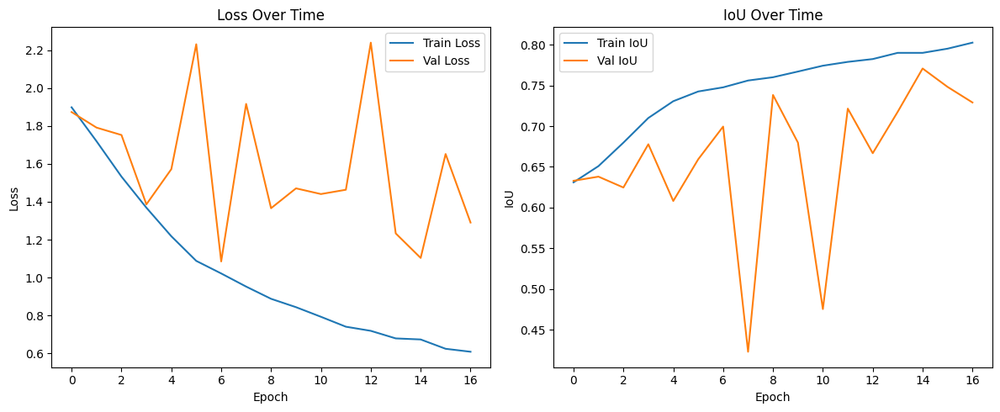

In [ ]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.title('Loss Over Time')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
    
plt.subplot(1, 2, 2)
plt.plot([m['iou'] for m in history['train_metrics']], label='Train IoU')
plt.plot([m['iou'] for m in history['val_metrics']], label='Val IoU')
plt.title('IoU Over Time')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()
    
plt.tight_layout()
plt.savefig(os.path.join(save_dir, 'training_history.png'))
plt.show()

In [ ]:
print("Evaluating model on test set...")
test_loss, test_metrics = evaluate_model(model, test_loader, criterion, DEVICE)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Metrics: {test_metrics}")

Evaluating model on test set...


Evaluating: 100%|██████████| 7/7 [00:32<00:00,  4.60s/it]

Test Loss: 1.2902
Test Metrics: {'accuracy': 0.8098100099695442, 'precision': np.float64(0.8821544750351025), 'recall': np.float64(0.8077567693576455), 'f1_score': np.float64(0.8430860624796963), 'iou': np.float64(0.729011664305607), 'specificity': np.float32(0.8130678)}


In [ ]:
with open(os.path.join(save_dir, 'test_results.txt'), 'w') as f:
    f.write(f"Test Loss: {test_loss:.4f}\n")
    for k, v in test_metrics.items():
        f.write(f"{k}: {v:.4f}\n")

In [ ]:
def predict(model, image_tensor, device):
    model.eval()
    with torch.no_grad():
        image_tensor = image_tensor.to(device)
        outputs = model(image_tensor)
        mask_pred = outputs['mask']
        class_pred = torch.argmax(outputs['main_class'], dim=1)
        moe_weights = outputs['moe_weights']
        attentions = outputs['attentions']
    return mask_pred, class_pred, moe_weights, attentions

Visualizing predictions...


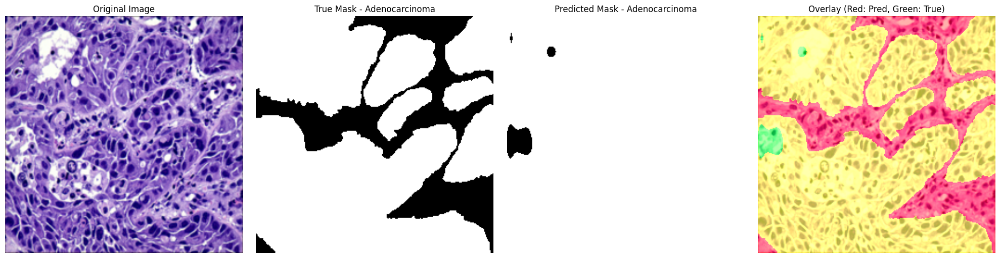

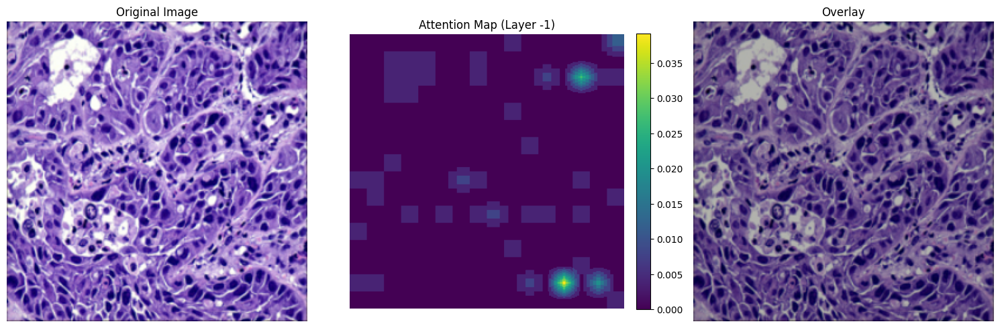

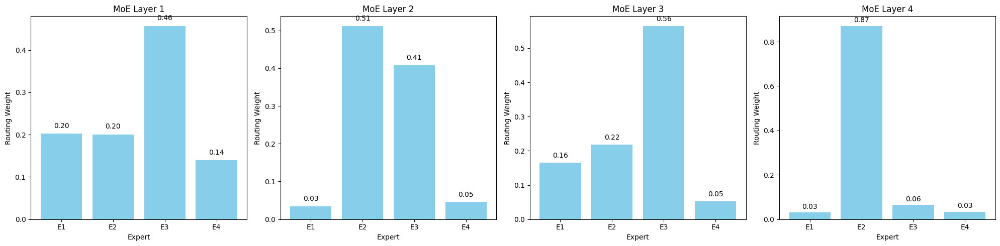

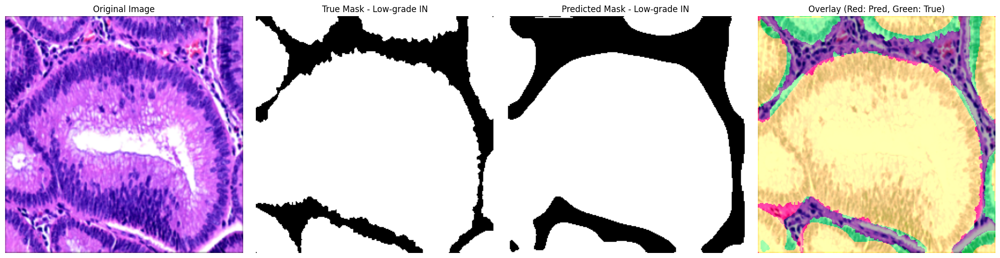

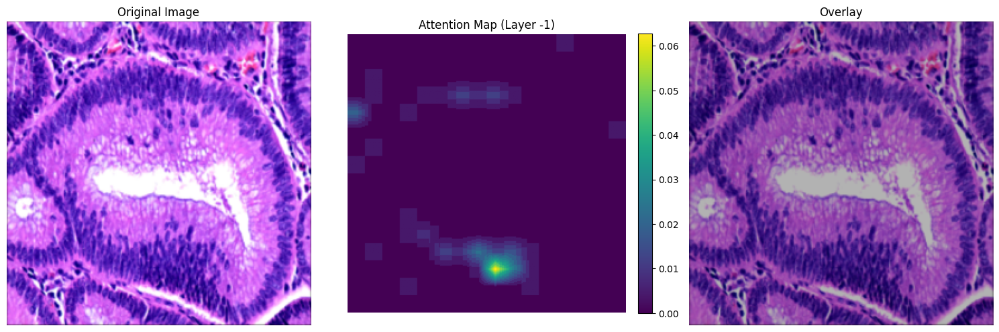

...

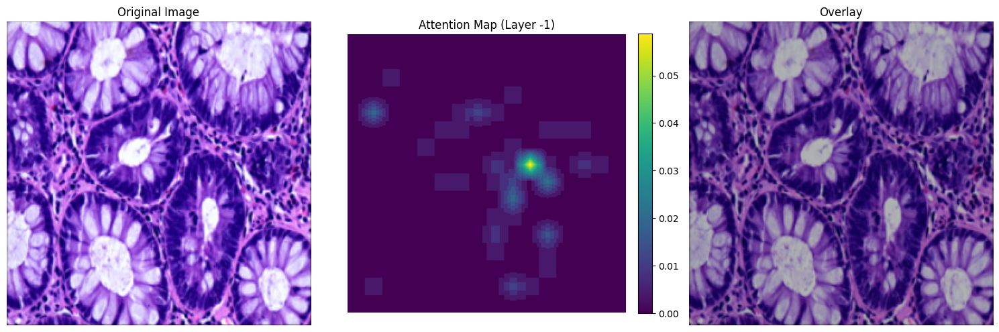

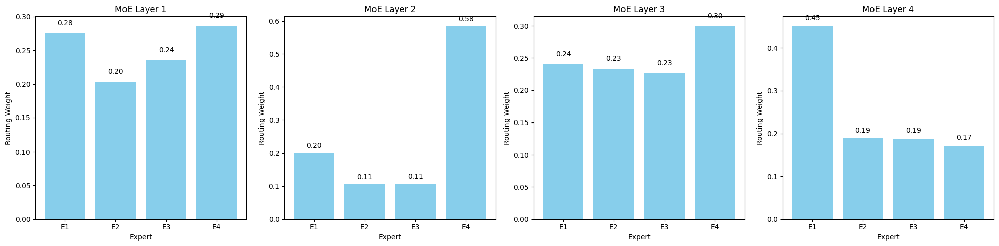

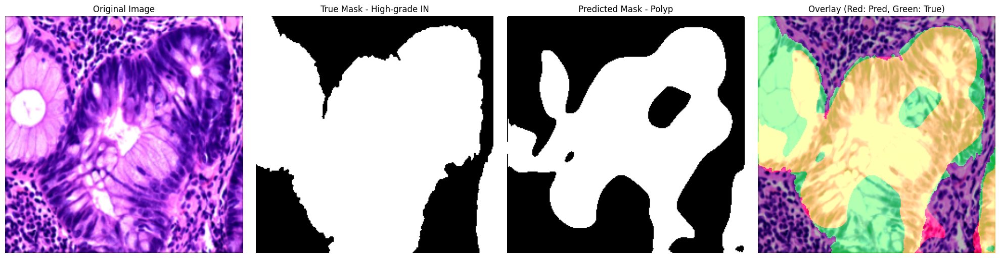

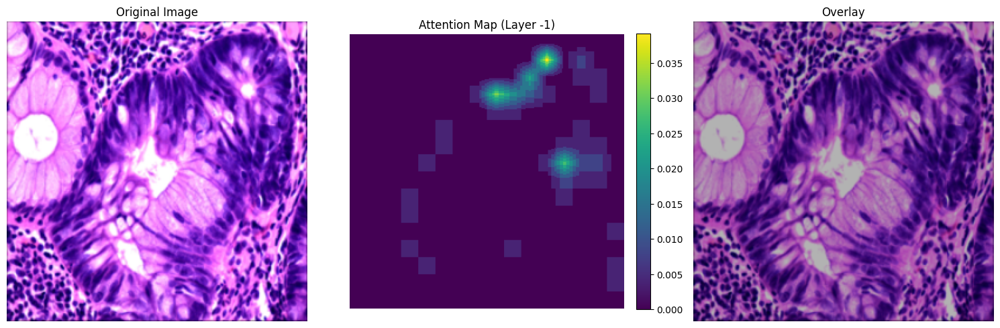

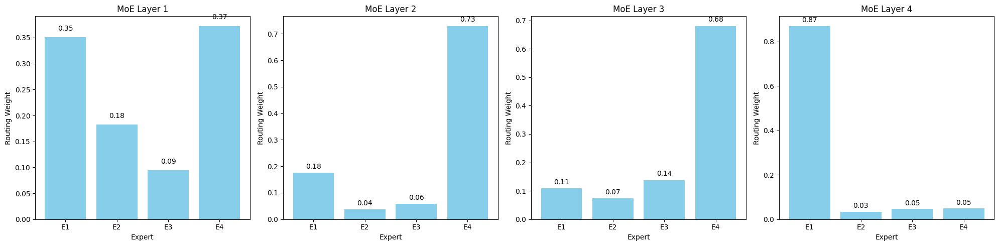

Done!


In [ ]:
print("Visualizing predictions...")
model.eval()
num_samples = min(5, len(test_dataset))
    
for i in range(num_samples):
    sample = test_dataset[i]
    image = sample['image'].unsqueeze(0)  
    true_mask = sample['mask']
    class_idx = sample['class_idx']
    class_name = sample['class_name']
        
    pred_mask, pred_class_idx, moe_weights, attentions = predict(model, image, DEVICE)
    pred_mask = pred_mask.squeeze(0).squeeze(0)
    pred_class_idx = pred_class_idx.item()
        
    fig = visualize_prediction(
        image=image.squeeze(0),
        true_mask=true_mask.squeeze() if true_mask.ndim > 2 else true_mask,
        pred_mask=pred_mask,
        class_name=class_name,
        pred_class_idx=pred_class_idx,
        class_names=test_dataset.dataset.class_names
    )
        
    fig.savefig(os.path.join(save_dir, f'prediction_{i}.png'))
    plt.show()
        
    fig = visualize_attention(
        image=image.squeeze(0),
        attention_maps=attentions,
        layer_idx=-1 
    )
        
    fig.savefig(os.path.join(save_dir, f'attention_{i}.png'))
    plt.show()
        
    fig = visualize_moe_routing(moe_weights)
        
    fig.savefig(os.path.join(save_dir, f'moe_routing_{i}.png'))
    plt.show()
print("Done!")